**INSTALLING AND IMPORTING MODEULS**

In [ ]:
!apt-get update
!pip install music21 pydub
!apt-get -y install lilypond
!apt-get install timidity
!apt-get install musescore

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.models import load_model
from pydub import AudioSegment
from IPython.display import Audio
import subprocess
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import os
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

**LOADING THE PREPROCESSED DATA**

In [ ]:
loaded_data = np.load('/content/drive/MyDrive/processed_data.npy', allow_pickle=True).item()
X_train = loaded_data['X_train']
mapping = loaded_data['mapping']
reverse_mapping = loaded_data['reverse_mapping']

**LOADING THE PRETRAINED MODEL**

In [ ]:
model = load_model("/content/drive/MyDrive/music_generation_lstm.h5")

**CREATING USEFUL FUNCTIONS**

In [ ]:
def show(music):
    display(Image(str(music.write("lily.png"))))

def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = []
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else:
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)
    return Melody_midi

**GENERATING MUSIC**

In [ ]:
def Melody_Generator(Note_Count):
    # Initialize seed with a random start from X_train
    seed_index = np.random.randint(0, len(X_train) - 1)
    seed = X_train[seed_index]

    Music = []
    Notes_Generated = []

    for i in range(Note_Count):
        # Reshape seed for model prediction
        length=40
        seed_reshaped = seed.reshape(1, length, 1)
        L_symb=266
        # Use the model to predict the next note
        prediction = model.predict(seed_reshaped, verbose=0)[0]
        # Apply a temperature to control the diversity of predictions
        temperature = 1.0  # You can adjust this value for more or less diversity
        prediction = np.log(prediction) / temperature
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)

        # Sample the index for the next note
        index = np.random.choice(len(prediction), p=prediction)

        # Check if the index is within the valid range
        if index < 0 or index >= len(reverse_mapping):
            continue

        # Convert the index back to a note or chord
        next_note = reverse_mapping[index]
        Notes_Generated.append(next_note)

        # Update the seed for the next iteration
        seed = np.append(seed[1:], index / float(L_symb))

    # Now, we have music in the form of a list of chords and notes, and we want to create a MIDI file.
    Melody = chords_n_notes(Notes_Generated)
    Melody_midi = stream.Stream(Melody)

    return Notes_Generated, Melody_midi

Enter the number of notes: 99


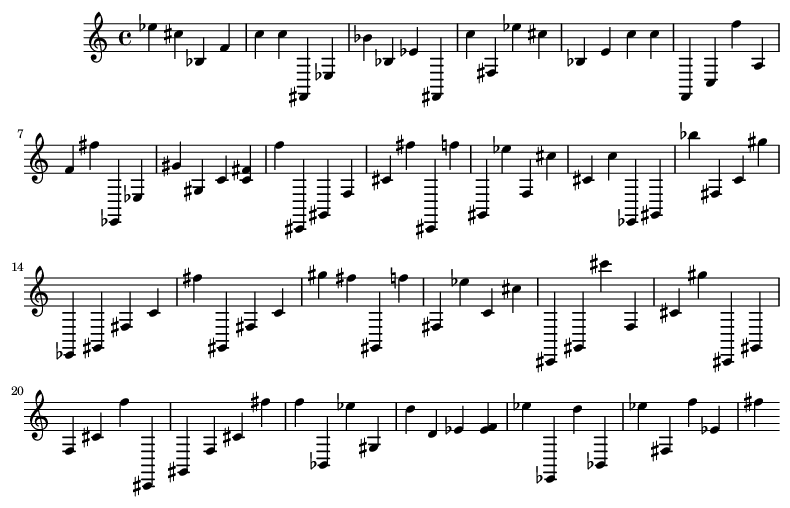

In [ ]:
notes_count=int(input("Enter the number of notes: "))
Music_notes, Melody = Melody_Generator(notes_count)
show(Melody)

In [ ]:
import datetime
Melody.write('midi','newmelody.mid')
midi_file_path = '/content/newmelody.mid'
wav_file_path = 'new_generated_music.wav'
subprocess.call(['timidity', midi_file_path, '-Ow', '-o', wav_file_path])
timestamp = datetime.datetime.now().strftime('%Y%m%d%H%M%S')
output_folder = '/content/drive/MyDrive/Generated songs'
mp3_file_path = f'{output_folder}/generated_music_{timestamp}.mp3'
audio = AudioSegment.from_wav(wav_file_path)
audio.export(mp3_file_path, format='mp3')
print(f'Music saved as MP3: {mp3_file_path}')
audio = Audio(wav_file_path)
display(audio)

Music saved as MP3: /content/drive/MyDrive/Generated songs/generated_music_20230917151240.mp3
